# Rock Porosity Project

In this project, we will calculate the porosity of a dry sandstone using a dataset of 256 images (256x256 pixels) obtained by x-ray tomography.

### Importing libraries:

In [3]:
# For getting information into arrays and plotting
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
# For opening an image content into an array:
from PIL import Image
# For managing files in memory
import os
# For calculating porosity
import porespy as ps

### Loading images

In [5]:
# Path to the files in memory:
images_path = '/Users/admin/Documents/python_image_analysis/Case4a_256x256x256' 

In [6]:
# Establishing the number of images using the os library listdir method 
number_images = len(os.listdir(images_path))

In [177]:
data = []  

images = sorted(os.listdir(images_path))    # Array with the sorted images

for file in images:
    try:
        image = Image.open(images_path + '/' + file)    # Opening every image content into an array
        image = np.array(image)     # Converting every image array into a numpy array
        data.append(image)     # Adding the result into the accumulator
    except:
        print('Error loading image')

data = np.array(data) # Converting the whole list of numpy arrays into a numpy array itself

We check the data shape we are left with after the loading process, it's a 3 dimensional numpy array, each of the vectors contains 256 elements with different values, each value represents the intensity of that particular voxel using a grey scale (from 0 to 255).

Therefore, what we get is a 3D image with 256 cuts (2D images) along the 3 different dimensional axis

In [180]:
print(data.shape)
print(type(data))

(256, 256, 256)
<class 'numpy.ndarray'>


Visualizing the first images along the z-axis in order to check it has been loaded correctly:

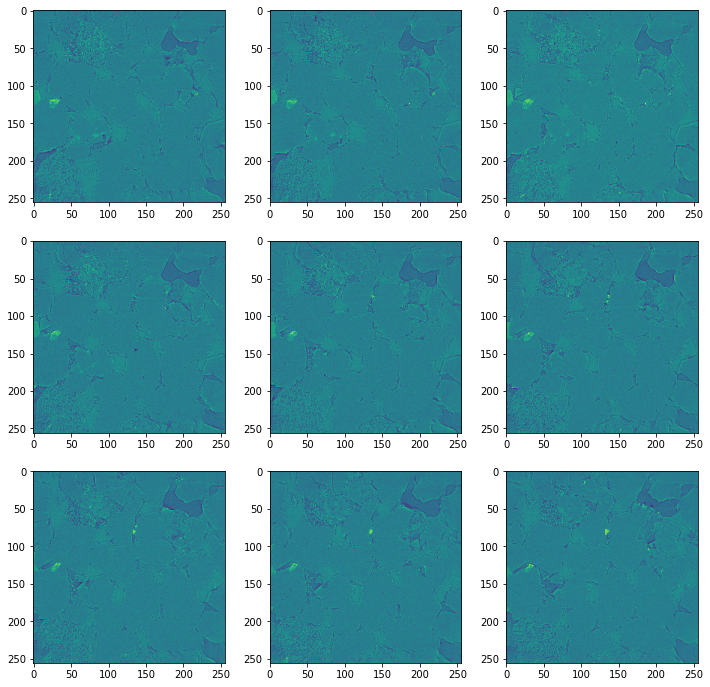

In [265]:
w = 10
h = 10
fig = plt.figure(figsize=(12, 12))
columns = 3
rows = 3
for i in range(1, columns*rows +1):
    img = data[i,:,:]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

### 3D visualization

In this 3D visualization we can notice the pores in darker colors

In [11]:
# Using napari for the 3d visualization
import napari   
from napari.utils import nbscreenshot
%gui qt
napari

<module 'napari' from '/opt/anaconda3/lib/python3.7/site-packages/napari/__init__.py'>

In [12]:
viewer = napari.Viewer(data)    #Setting the viewer for our data

/opt/anaconda3/lib/python3.7/site-packages/napari/utils/dask_utils.py:179: UserWarning: For best performance with Dask arrays in napari, please upgrade Dask to v2.15.0 or later. Current version is 2.11.0
  dask_version=dask.__version__,


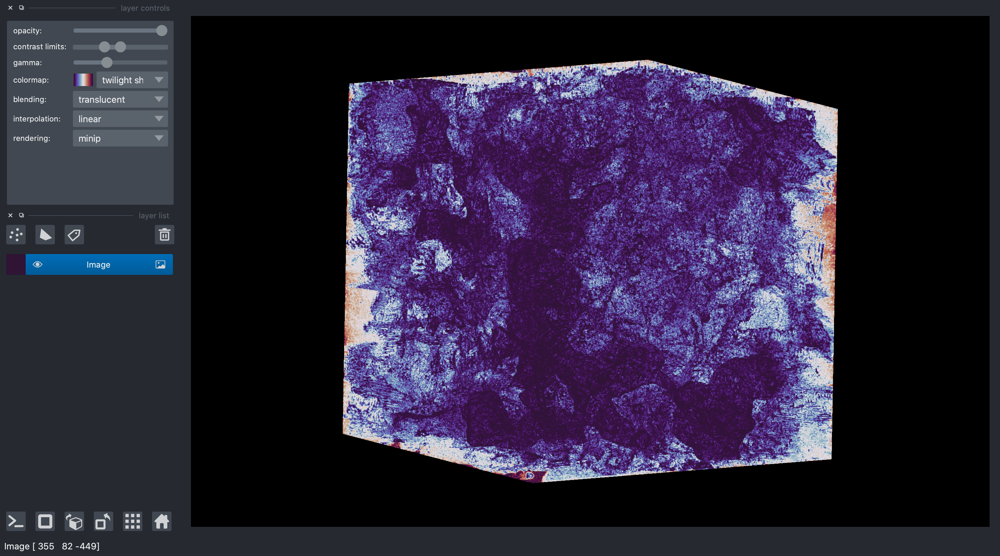

In [13]:
nbscreenshot(viewer)

### Image processing

In this section we will process the 3D image in order to identify pores, then we will convert the 3D image into a 3D binary image where 0 will represent the pores and 1 the solid surface.

For that purpose, we will first select a random 2D cut from our 3D image:

In [239]:
# Selecting a random image from our dataset
image1 = data[:,:,100] 

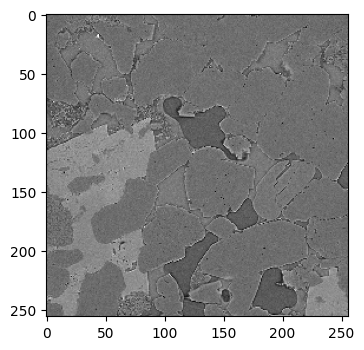

In [266]:
# Image representation using a greyscale map 
plt.figure(figsize=(4, 4), dpi=100)
plt.imshow(image1, cmap=plt.cm.gray)

We will now explore the distribution of pixel values along the x and y axis of this particular image in order to establish the best threeshold that will eventually determine what and what not a pore is.

Then, we will see how the image looks after passing the chosen threshold in order to make it binary.

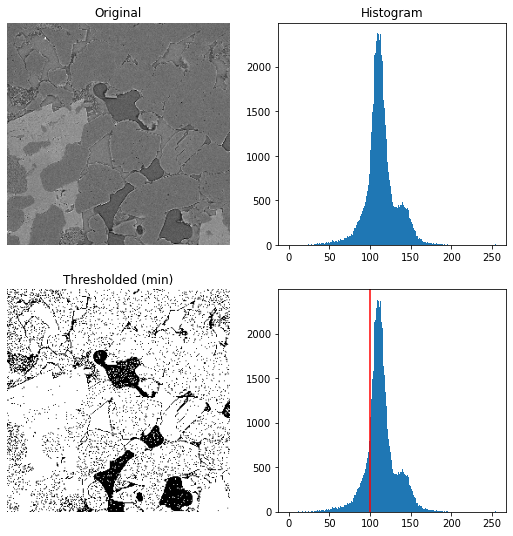

In [318]:
image = image1

thresh_min = 100    # Chosen threshold
binary_min = image > thresh_min    # Turning the image into a 

fig, ax = plt.subplots(2, 2, figsize=(9, 9))

ax[0, 0].imshow(image, cmap=plt.cm.gray)
ax[0, 0].set_title('Original')

ax[0, 1].hist(image.ravel(), bins=256)
ax[0, 1].set_title('Histogram')

ax[1, 0].imshow(binary_min, cmap=plt.cm.gray)
ax[1, 0].set_title('Thresholded (min)')

ax[1, 1].hist(image.ravel(), bins=256)
ax[1, 1].axvline(thresh_min, color='r')

for a in ax[:, 0]:
    a.axis('off')
plt.show()

With the information obtained from the histogram and adjusting the threshold several times, it seems like the best choice is somewhere near 100.

The problem lays in the fact that we cannot avoid noise in the picture (both in the pores and in the solid surface), therefore we need to define pores using a different algorithm.

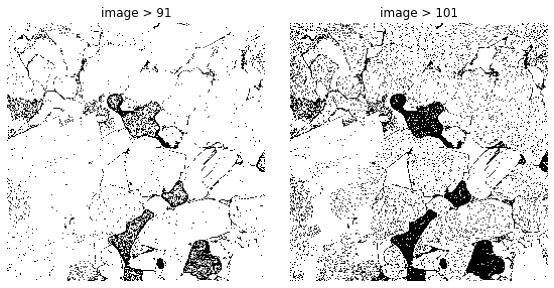

In [235]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

axes[0].imshow(image1 > 91, cmap=plt.cm.gray)
axes[0].set_title('image > 91')

axes[1].imshow(image1 > 101, cmap=plt.cm.gray)
axes[1].set_title('image > 101')

for a in axes:
    a.axis('off')

plt.tight_layout()

#### Segmentation

Given the nature of the 3D image we are working with, the best approach would be using a **watershed transformation** because it's gray scaled and the borders between pores and solid surfaces are clear.

The watershed transformation accepts several pixel values as basin heights, each argument would be a basin. After these basins have been set, the image will be as if it was flooded with water in order to indentify the pores. Each basin will represent, therefore, a pore.

For that purpose, we first need to turn our image into a topographic map, in order to do this we need to use a **Sobel operator**. A Sobel operator consists of two 3x3 kernels that, when convolved with the image, is capable of generate both, vertical and horizontal borders:

$\mathbf{G}_x = \begin{bmatrix} 
 +1 & 0 & -1  \\
+2 & 0 & -2 \\
+1 & 0 & -1 
\end{bmatrix} * \mathbf{A}
\quad
\mbox{and}
\quad   
\mathbf{G}_y = \begin{bmatrix} 
 +1 & +2 & +1\\
 0 & 0 & 0 \\
-1 & -2 & -1
\end{bmatrix} * \mathbf{A}
$

We will use the **scikit-image** library in order to implement the Sobel operator and the watershed transformation.

(-0.5, 255.5, 255.5, -0.5)

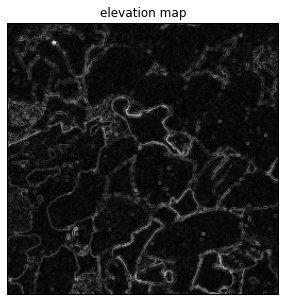

In [241]:
from skimage.filters import sobel

elevation_map = sobel(image1)

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(elevation_map, cmap=plt.cm.gray)
ax.set_title('elevation map')
ax.axis('off')

Now that we have turned the image into a topographic elevation map, we have to choose the different heights of the basins lowest point, we will use two basins in our case.

After experimenting with different heights we reached an optimal that seems to define the pores accurately:

(-0.5, 255.5, 255.5, -0.5)

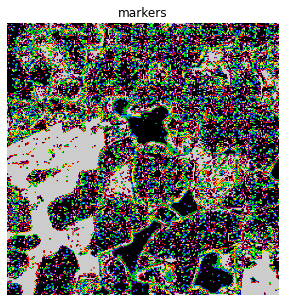

In [257]:
markers = np.zeros_like(image1)
markers[image1 < 79] = 1
markers[image1 > 114] = 2

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(markers, cmap=plt.cm.nipy_spectral)
ax.set_title('markers')
ax.axis('off')

Now it's possible to implement the watershed transformation alogirthm in order to define the pores.

As we can see, the result contains much less noise than using just a threshold, therefore we will use this algorithm to convert the whole 3D image into a binary image.

(-0.5, 255.5, 255.5, -0.5)

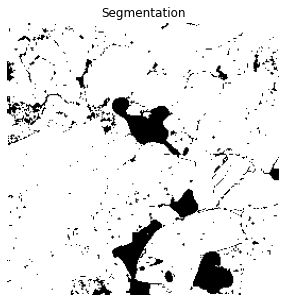

In [258]:
from skimage import segmentation

segmentation_pores = segmentation.watershed(elevation_map, markers)

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(segmentation_pores, cmap=plt.cm.gray)
ax.set_title('Segmentation')
ax.axis('off')

In [196]:
binary_data = []

# Using a for loop to apply the same processing to all the cuts that are part of the 3D image:

for i in range(data.shape[0]):
    elevation_map_data = sobel(data[i]) 
    markers = np.zeros_like(data[i])
    markers[data[i] < 79] = 1
    markers[data[i] > 114] = 2
    binary_data.append(segmentation.watershed(elevation_map_data, markers))


binary_data = np.array(binary_data)     # We make sure it gets transformed into a 3D numpy array 
binary_data = binary_data > 1     # We make it binary like this

Checking the first nine cuts to check they were processed correctly:

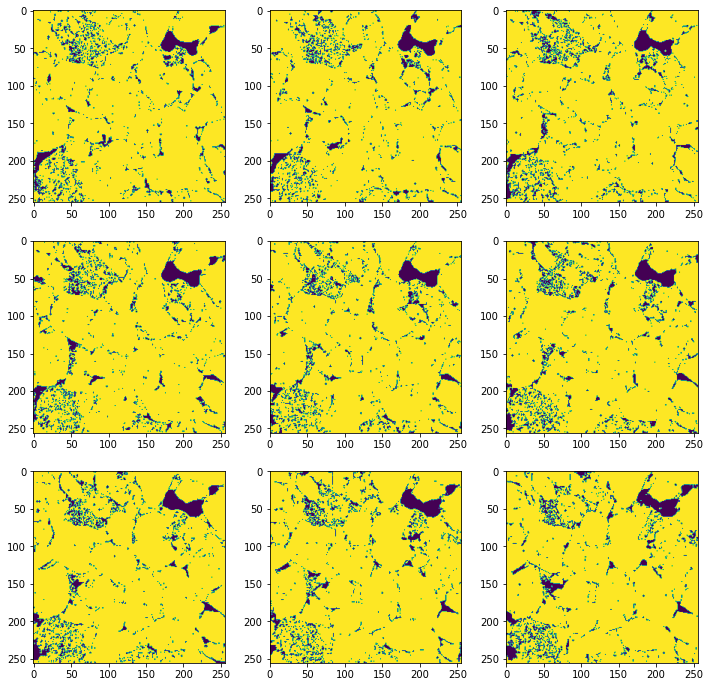

In [267]:
w = 10
h = 10
fig = plt.figure(figsize=(12, 12))
columns = 3
rows = 3
for i in range(1, columns*rows +1):
    img = binary_data[i,:,:]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

If we visualize now the binary 3D image we obtained we can see the pores clearly in white.

In [209]:
viewer = napari.view_image(binary_data)

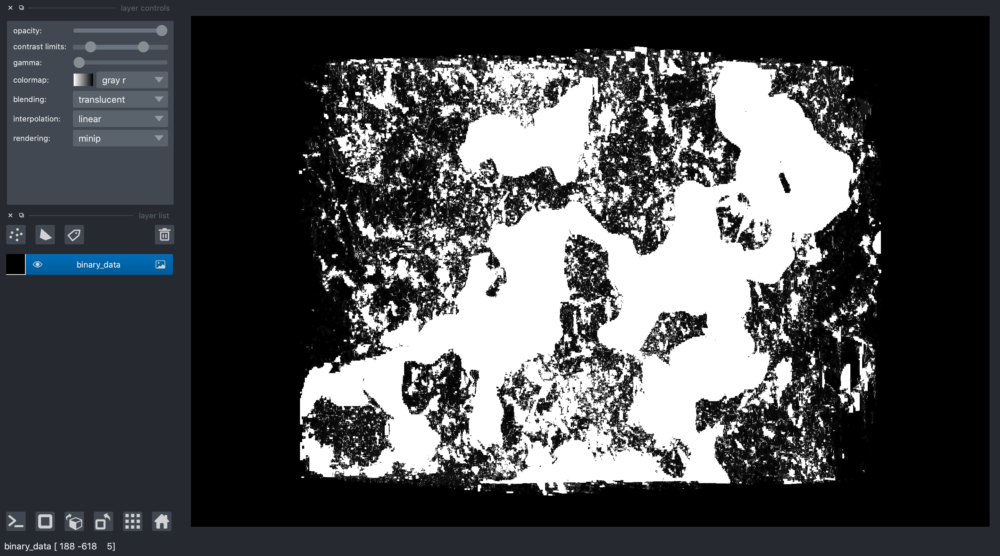

In [210]:
nbscreenshot(viewer)

### Porosity calculation

Now that pores were succesfully identified we can now calculate the porosity, we will use the **PoresPy** library for that purpose.

The metric **porosity_profile** calculates the porosity at an any given cut, it allows us to calculate changes in the poristy along the image different axis.

The porosity profile results will be substracted from one, this is because we chose the 0 to represent the pores and not 1 for an easier visualization.

In [199]:
x_profile = 1 - ps.metrics.porosity_profile(binary_data, 0)
y_profile = 1 - ps.metrics.porosity_profile(binary_data, 1)
z_profile = 1 - ps.metrics.porosity_profile(binary_data, 2)

The plot below represents the changes in the porosity along the 3 different axis. As we can see, the porosity ranges between around 14% (yz plane) and around 4% (xy plane) in porcentage points.

The dataset images are represented by the blue line, the porosity ranges from **0.6384** in the **cut 138**, and **0.1413** in the **cut 238**.

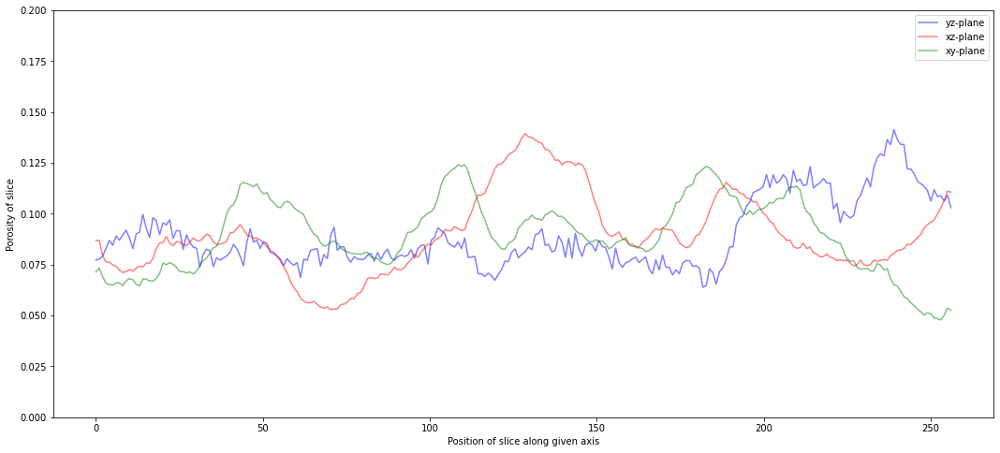

In [217]:
fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(np.linspace(0, binary_data.shape[0], binary_data.shape[0]), x_profile, 'b-', label='yz-plane', alpha=0.5)
ax.plot(np.linspace(0, binary_data.shape[1], binary_data.shape[1]), y_profile, 'r-', label='xz-plane', alpha=0.5)
ax.plot(np.linspace(0, binary_data.shape[2], binary_data.shape[2]), z_profile, 'g-', label='xy-plane', alpha=0.5)
ax.set_ylim([0, 0.2])
ax.set_ylabel('Porosity of slice')
ax.set_xlabel('Position of slice along given axis')
ax.legend();

In [292]:
# Minimum porosity percentage plane xz
percentage_min_xz = np.round((1-max(ps.metrics.porosity_profile(binary_data, 0)))*100,3)
print(percentage_min_xz)

6.384


In [293]:
# Maximum porosity percentage plane xz
percentage_max_xz = np.round((1-min(ps.metrics.porosity_profile(binary_data, 0)))*100,3)
print(percentage_max_xz)

14.13


In [294]:
# Plane xz cut with the maximum porosity
max_cut_xz = np.argmin(ps.metrics.porosity_profile(binary_data, 0))
print(max_cut_xz)

238


In [295]:
# Plane xz cut with the maximum porosity
min_cut_xz = np.argmax(ps.metrics.porosity_profile(binary_data, 0))
print(min_cut_xz)

181


### Solid surface calculation at a given cut

We will use the cuts with the maximum and minimum porosity as an example for specific surface calculation.

As the dataset did not provide any information about the **voxel size** we will use **5.58 micrometers** as size as it is one of the standards in x-ray tomographies. Therefore, every pixel in these pictures would be assumed to be 5.58$\mu$mx5.58$\mu$m, every voxel 5.58$\mu$mx5.58$\mu$mx5.58$\mu$m, every cut will be 1428.48$\mu$mx1428.48$\mu$m and the whole image 1428.48$\mu$mx1428.48$\mu$mx1428.48$\mu$m.

First, we will visualize both cuts using their image in a grey map and their binary versions.

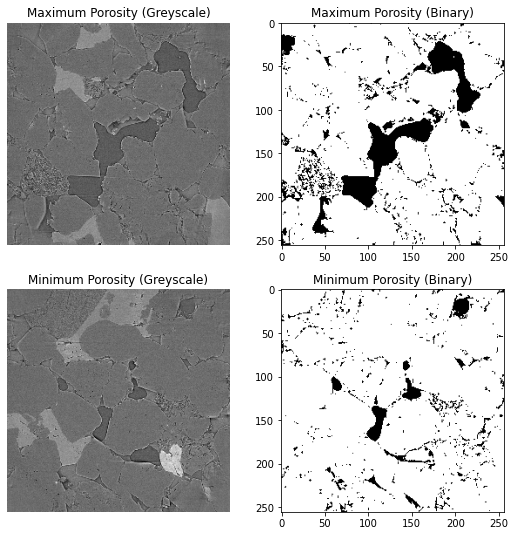

<Figure size 432x288 with 0 Axes>

In [268]:
fig, ax = plt.subplots(2, 2, figsize=(9, 9))

ax[0, 0].imshow(data[238,:,:], cmap=plt.cm.gray)
ax[0, 0].set_title('Maximum Porosity (Greyscale)')

ax[0, 1].imshow(binary_data[238,:,:], cmap=plt.cm.gray)
ax[0, 1].set_title('Maximum Porosity (Binary)')

ax[1, 0].imshow(data[181,:,:], cmap=plt.cm.gray)
ax[1, 0].set_title('Minimum Porosity (Greyscale)')

ax[1, 1].imshow(binary_data[181,:,:], cmap=plt.cm.gray)
ax[1, 1].set_title('Minimum Porosity (Binary)')

for a in ax[:, 0]:
    a.axis('off')
    
plt.show()

plt.tight_layout()

In [336]:
# Transforming the sizes into centimetres

size_micrometers = 5.58

cut_size = np.round((256*size_micrometers)**2/1000000,2)
rock_total_volume = np.round((256*size_micrometers)**3/1000000000,2)

print (f'The size of any given cut is {cut_size} mm2')
print(f'The rock total volume is {rock_total_volume} mm3')

The size of any given cut is 2.04 mm2
The rock total volume is 2.91 mm3


In [339]:
# Calculating the cuts solid surfaces

maximum_porosity_solid_surface = np.round(((1 - percentage_max_xz/100)*cut_size), 2)
minimum_porosity_solid_surface = np.round(((1 - percentage_min_xz/100)*cut_size), 2)

print(f'The maximum porosity cut solid surface is {maximum_porosity_solid_surface} mm2 out of {cut_size} mm2')
print(f'The minimum porosity cut solid surface is {minimum_porosity_solid_surface} mm2 out of {cut_size} mm2')

The maximum porosity cut solid surface is 1.75 mm2 out of 2.04 mm2
The minimum porosity cut solid surface is 1.91 mm2 out of 2.04 mm2


### Calculating rock porosity

In order to calculate the rock porosity we used the **metric 'porosity'** from the library **PoresPy**.

Rock porosity is 0.0894, something common for this type of rock.

In [343]:
porosity_percentage = np.round((1 - ps.metrics.porosity(binary_data))*100,2)
porosity = np.round((1 - ps.metrics.porosity(binary_data)),4)

print(f'Porosity percentage: {porosity_percentage}%')
print(f'Porosity: {porosity}')

Porosity percentage: 8.94%
Porosity: 0.0894


We can calculate now the whole volume of solid material:

In [340]:
solid_material = np.round((1-porosity)*rock_total_volume, 2)
print(f'The solid volume is {solid_material} mm3 out of a total volume of {rock_total_volume} mm3')

The solid volume is 2.65 mm3 out of a total volume of 2.91 mm3
